In [1]:
import pandas as pd
import re
import numpy as np
import re
import sys

## Step0: 安裝套件

* Install [pandas_profiling](https://github.com/ydataai/pandas-profiling) package

* Problem: colab使用此package會產生的error，參考[這篇解法](https://python.plainenglish.io/how-to-use-pandas-profiling-on-google-colab-e34f34ff1c9f)

第一次灌完package要先重啟kernel


In [2]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     -------------------------------------- 25.9/25.9 MB 196.1 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ------------------------------------ 307.0/307.0 KB 387.9 kB/s eta 0:00:00
     ---------------------------------------- 4.7/4.7 MB 2.9 MB/s eta 0:00:00
  Created wheel for pandas-profiling: filename=pandas_profiling-3.1.1-py2.py3-none-any.whl size=261278 sha256=2fc7c40b92d488c3299e49876644b09cc7b422f295640d453764750619824734
  Stored in directory: C:\Users\lenovon\AppData\Local\Temp\pip-ephem-wheel-cache-guu5bbx6\wheels\cc\d5\09\083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
Successfully built pandas-profiling
  Attempting uninstall: tangled-up-in-unicode
    Found existing installation: tangled-up-in-unicode 0.1.0
    Uninstalling tangled-up-in-unicode-0.1.0:
      Successfully uninstalled tangled-up-in-unicode-0.1.0
  Attempting uninstall: joblib
    Found existing installation: joblib 1.0.1
   

In [3]:
from pandas_profiling import ProfileReport

# Step1: 讀檔
* 連接Google drive檔案
* 讀取檔案

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path='/content/drive/MyDrive/Colab Notebooks/1111 ML複試資料集/'

In [11]:
data=pd.read_csv(f'{path}IBM_HR.csv',encoding='utf_8_sig')

# Step2: EDA
* EDA by pandas_profiling package
* EDA 觀察
* EDA by seaborn
* preprocessing

## EDA by pandas_profiling package

In [13]:
ProfileReport(data,title='HR資料探索',explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## EDA 觀察
* By pandas profiling
0. 此資料是HR資料，包含預測變數是否離職，是binary classification任務
1. 資料是多重共線性資料(也就是很多變數同質性過高)，需要進行變數篩選
2. 有一些變數為常數(ex: EmployeeCount)或唯一編碼(ex: EmployeeNumber)，在僅有此資料集情況下，無任何實質意義，共刪除4個變數
3. 此資料集沒有任何空值

* By seaborn
0. 常出差的明顯離職比例較高
1. JobRole(職務)明顯離職率有差異，有些職務變動頻繁(如:人資、銷售)
2. 超時工作與員工離職有很大的正向原因
3. 單身員工有較高的離職傾向
4. 大多有序類別變數皆是非常不滿意有較高的離職傾向，其餘差異不大
5. 連續變數方面，可以看出來主要影響的因素有年紀、離家距離、**工作收入**、總年資、該職缺年資、同一主管的年資

* 可新增變數

I. 平均公司待的時長(員工的定性): TotalWorkingYears/NumCompaniesWorked

II. 日費率比時費率: DailyRate/HourlyRate

III. 月費率比日費率: MonthlyRate/DailyRate

IV. 表現跟加薪程度相乘: PerformanceRating*PercentSalaryHike(這裡注意PerformanceRating是順序類別變數，當作連續變數使用只是希望數值越大能夠代表加薪幅度與表現有成正向關係，有可能非常傑出表現加薪很少，會造成員工離職的原因

V: 在這家公司有換過主管: YearsAtCompany == YearsWithCurrManager

VI: 有換過公司: NumCompaniesWorked > 0

VII: 有換過職務: YearsAtCompany == YearsInCurrentRole(因為在這職缺的年數皆小於等於公司年數，代表是指在同一間公司待的時間)

In [14]:
#0
data.drop(['StandardHours','EmployeeCount','EmployeeNumber','Over18'],axis=1,inplace=True)

In [15]:
#觀察資料變數型態
var_type=data.dtypes

categorical_var=var_type[var_type == 'object'].index.tolist()

categorical_order_var=[
            'Education',
            'EnvironmentSatisfaction',
            'JobInvolvement',
            'JobLevel',
            'JobSatisfaction',
            'PerformanceRating',
            'RelationshipSatisfaction',
            'StockOptionLevel',
            'WorkLifeBalance'
            ]

numeric_var=[v for v in var_type.index.tolist() if v not in categorical_var]

## EDA by seaborn 

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

<AxesSubplot:>

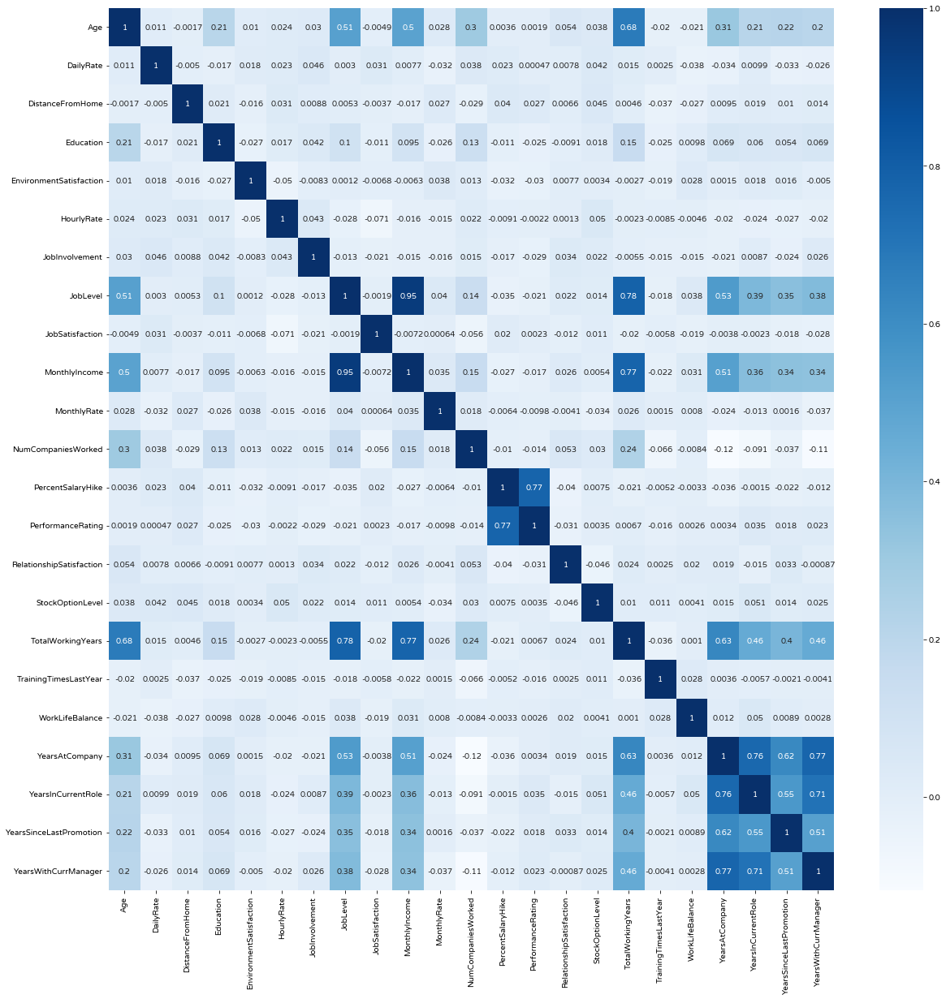

In [17]:
#correlation of numeric variable
plt.figure(figsize=(20,20))

sns.heatmap(data.corr(),annot=True,cmap='Blues')

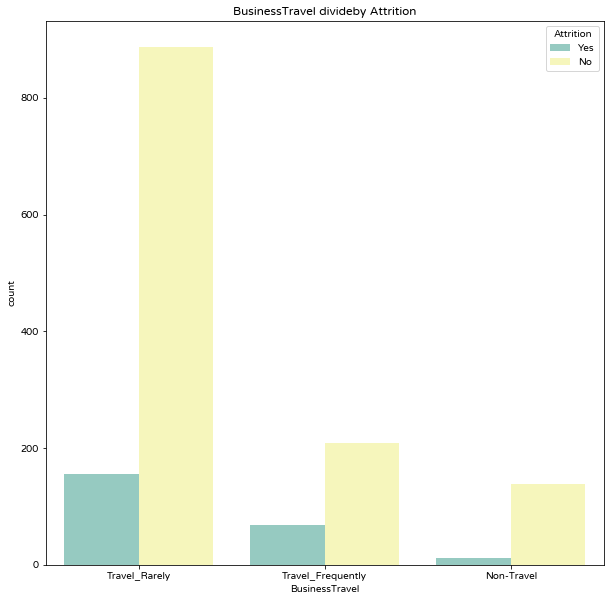

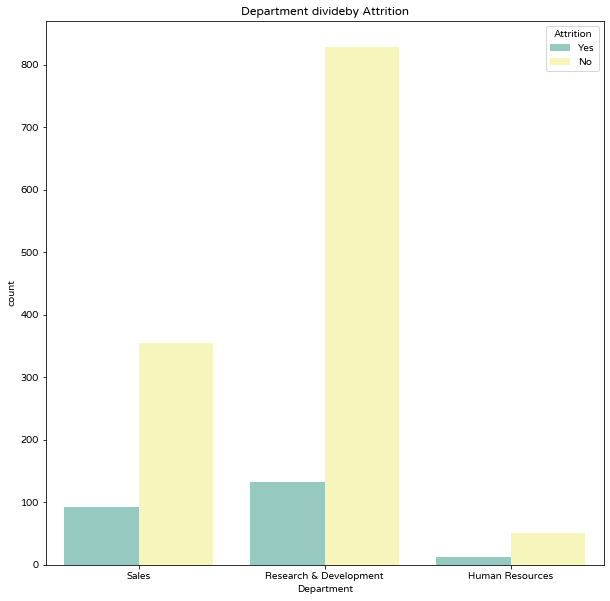

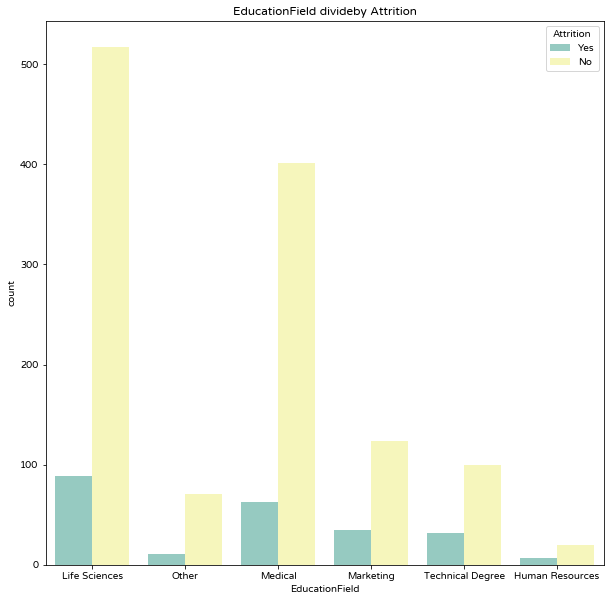

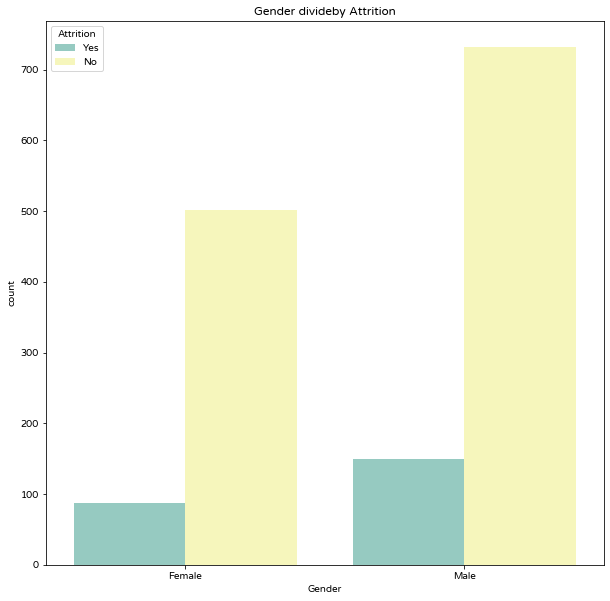

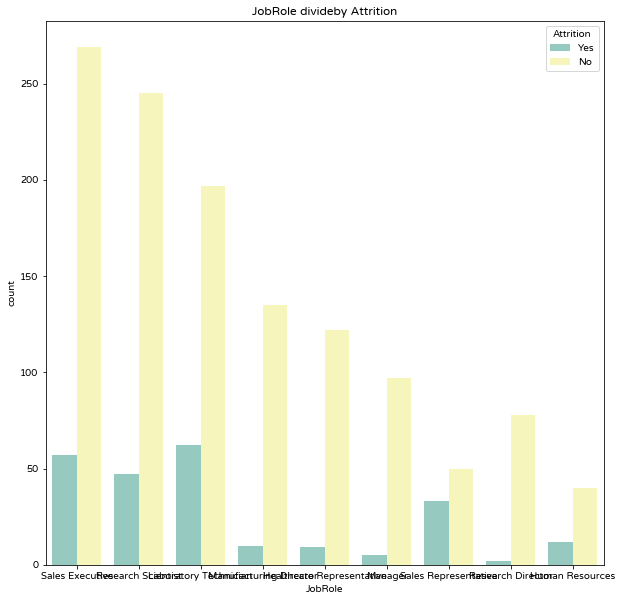

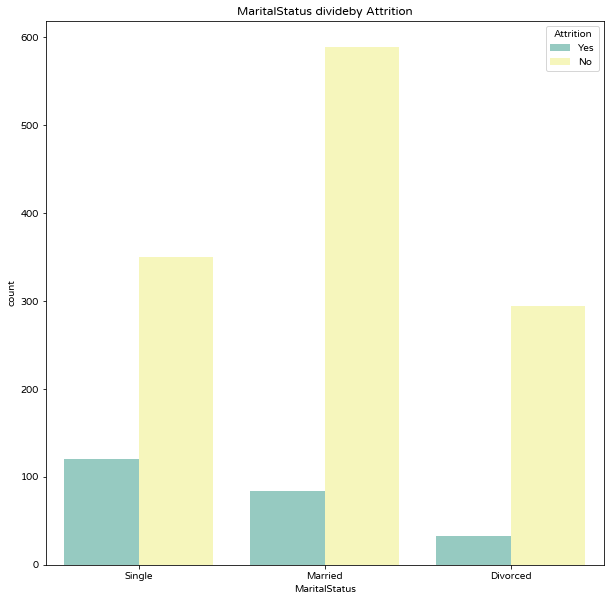

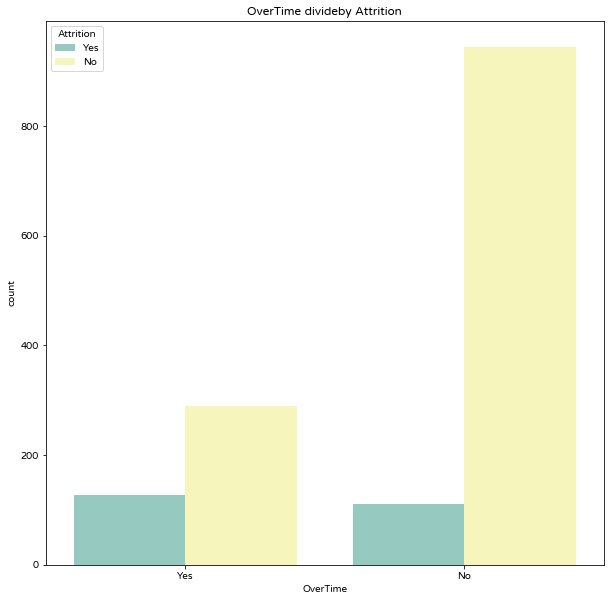

In [18]:
#see attrition with other variables
#categorical variables
for c in [v for v in categorical_var if v != 'Attrition']:
    plt.figure(figsize=(10,10))
    sns.countplot(x=c,palette = "Set3", hue='Attrition', data=data).set(title=f'{c} divideby Attrition')

In [20]:
#Look categorical divide by attrition use percentage to look clearly difference
for c in [v for v in categorical_var if v != 'Attrition']:
    table=pd.crosstab(data.Attrition,data[c])

    print(f'{c} divideby Attrition')
    display(table/table.sum())

    print('*'*50,'\n\n')

BusinessTravel divideby Attrition


BusinessTravel,Non-Travel,Travel_Frequently,Travel_Rarely
Attrition,,,
No,0.92,0.750903,0.850431
Yes,0.08,0.249097,0.149569


************************************************** 


Department divideby Attrition


Department,Human Resources,Research & Development,Sales
Attrition,,,
No,0.809524,0.861602,0.793722
Yes,0.190476,0.138398,0.206278


************************************************** 


EducationField divideby Attrition


EducationField,Human Resources,Life Sciences,Marketing,Medical,Other,Technical Degree
Attrition,,,,,,
No,0.740741,0.853135,0.779874,0.864224,0.865854,0.757576
Yes,0.259259,0.146865,0.220126,0.135776,0.134146,0.242424


************************************************** 


Gender divideby Attrition


Gender,Female,Male
Attrition,,
No,0.852041,0.829932
Yes,0.147959,0.170068


************************************************** 


JobRole divideby Attrition


JobRole,Healthcare Representative,Human Resources,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative
Attrition,,,,,,,,,
No,0.931298,0.769231,0.760618,0.95098,0.931034,0.975,0.839041,0.825153,0.60241
Yes,0.068702,0.230769,0.239382,0.04902,0.068966,0.025,0.160959,0.174847,0.39759


************************************************** 


MaritalStatus divideby Attrition


MaritalStatus,Divorced,Married,Single
Attrition,,,
No,0.899083,0.875186,0.744681
Yes,0.100917,0.124814,0.255319


************************************************** 


OverTime divideby Attrition


OverTime,No,Yes
Attrition,,
No,0.895636,0.694712
Yes,0.104364,0.305288


************************************************** 




In [21]:
#Look ordinary categorical divide by attrition use percentage to look clearly difference
for c in categorical_order_var:
    table=pd.crosstab(data.Attrition,data[c])

    print(f'{c} divideby Attrition')
    display(table/table.sum())

    print('*'*50,'\n\n')

Education divideby Attrition


Education,1,2,3,4,5
Attrition,,,,,
No,0.817647,0.843972,0.826923,0.854271,0.895833
Yes,0.182353,0.156028,0.173077,0.145729,0.104167


************************************************** 


EnvironmentSatisfaction divideby Attrition


EnvironmentSatisfaction,1,2,3,4
Attrition,,,,
No,0.746479,0.850174,0.863135,0.865471
Yes,0.253521,0.149826,0.136865,0.134529


************************************************** 


JobInvolvement divideby Attrition


JobInvolvement,1,2,3,4
Attrition,,,,
No,0.662651,0.810667,0.855991,0.909722
Yes,0.337349,0.189333,0.144009,0.090278


************************************************** 


JobLevel divideby Attrition


JobLevel,1,2,3,4,5
Attrition,,,,,
No,0.736648,0.902622,0.853211,0.95283,0.927536
Yes,0.263352,0.097378,0.146789,0.04717,0.072464


************************************************** 


JobSatisfaction divideby Attrition


JobSatisfaction,1,2,3,4
Attrition,,,,
No,0.771626,0.835714,0.834842,0.88671
Yes,0.228374,0.164286,0.165158,0.11329


************************************************** 


PerformanceRating divideby Attrition


PerformanceRating,3,4
Attrition,,
No,0.839228,0.836283
Yes,0.160772,0.163717


************************************************** 


RelationshipSatisfaction divideby Attrition


RelationshipSatisfaction,1,2,3,4
Attrition,,,,
No,0.793478,0.851485,0.845316,0.851852
Yes,0.206522,0.148515,0.154684,0.148148


************************************************** 


StockOptionLevel divideby Attrition


StockOptionLevel,0,1,2,3
Attrition,,,,
No,0.755943,0.90604,0.924051,0.823529
Yes,0.244057,0.09396,0.075949,0.176471


************************************************** 


WorkLifeBalance divideby Attrition


WorkLifeBalance,1,2,3,4
Attrition,,,,
No,0.6875,0.831395,0.857783,0.823529
Yes,0.3125,0.168605,0.142217,0.176471


************************************************** 




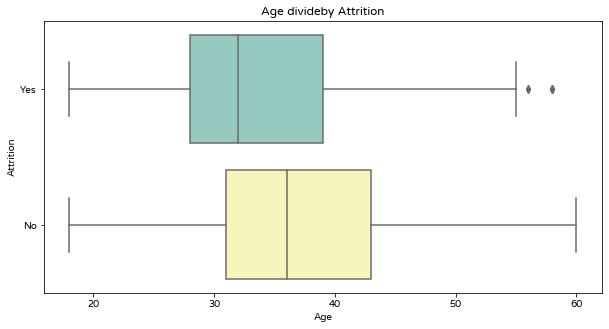

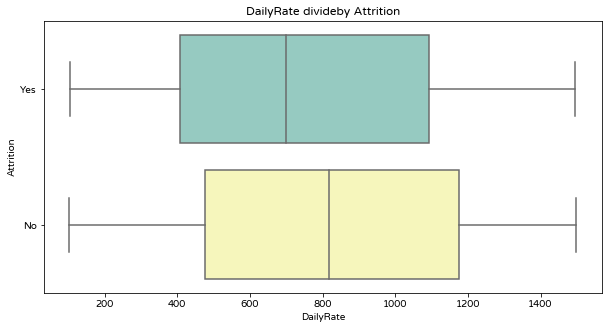

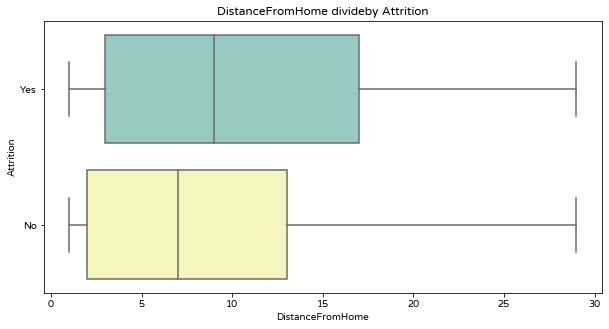

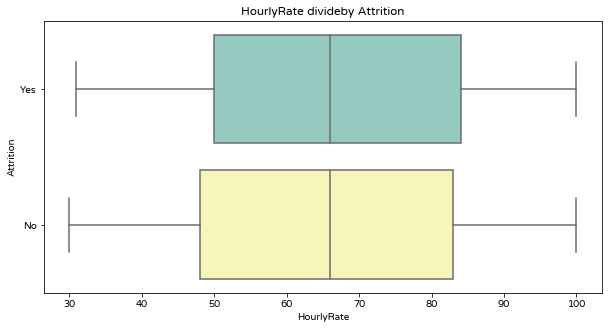

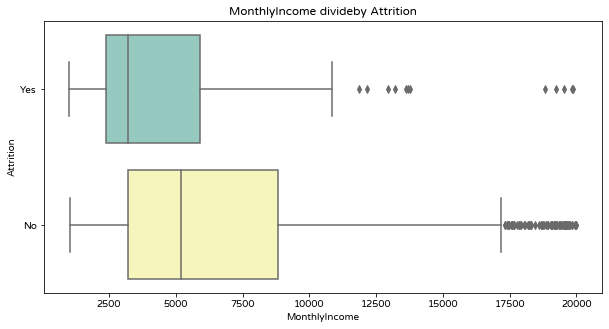

...

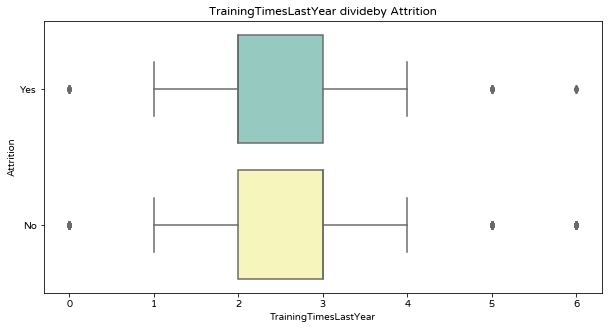

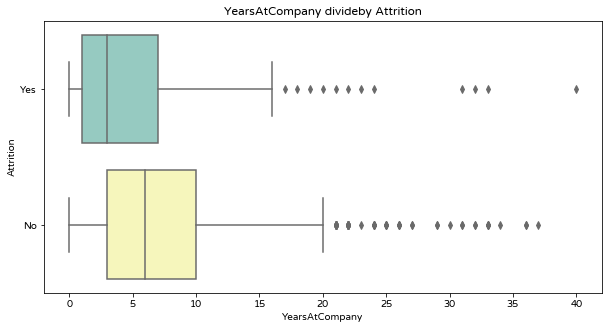

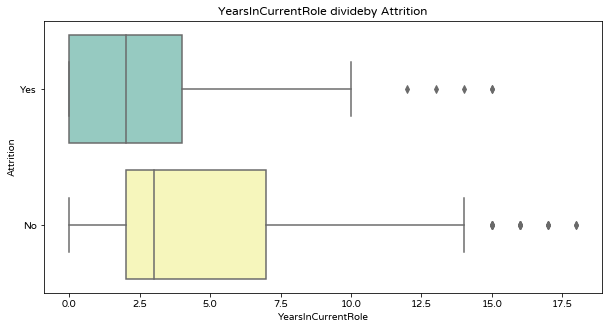

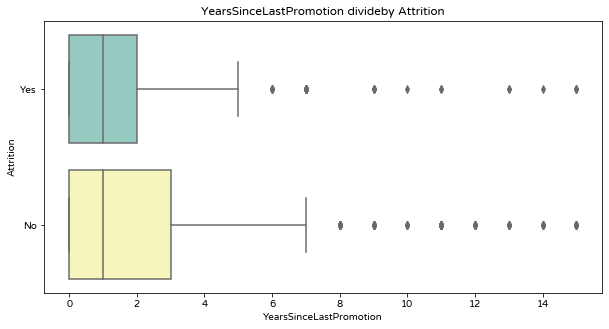

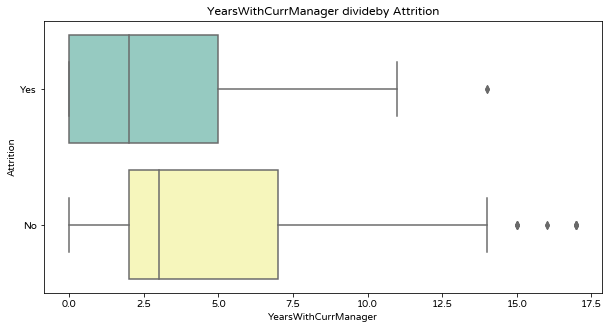

In [22]:
#plot boxplot with numerical var with attrition
#numerical variable
for c in [v for v in numeric_var if v not in categorical_order_var]:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=c,palette = "Set3", y='Attrition', data=data,orient='h').set(title=f'{c} divideby Attrition')
    plt.show()

## Preprocessing
* 新增變數
* 觀察新增的變數

In [23]:
data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [24]:
#新增變數
#當以前沒有工作過的話相除會出事，加上目前這家公司(+1)，避免這種情形產生
data['worked_stable']=data['TotalWorkingYears']/(data['NumCompaniesWorked']+1)

data['daily_hour_ratio']=data['DailyRate']/data['HourlyRate']
data['month_daily_ratio']=data['MonthlyRate']/data['DailyRate']
data['performance_salaryraise_match']=data['PerformanceRating']*data['PercentSalaryHike']
data['manager_change']=data['YearsAtCompany'] == data['YearsWithCurrManager']
data['company_change']=data['NumCompaniesWorked']>0
data['role_change']=data['YearsAtCompany'] == data['YearsInCurrentRole']

new_numeric_var=['worked_stable','daily_hour_ratio','month_daily_ratio','performance_salaryraise_match']
new_categorical_var=['manager_change','company_change','role_change']

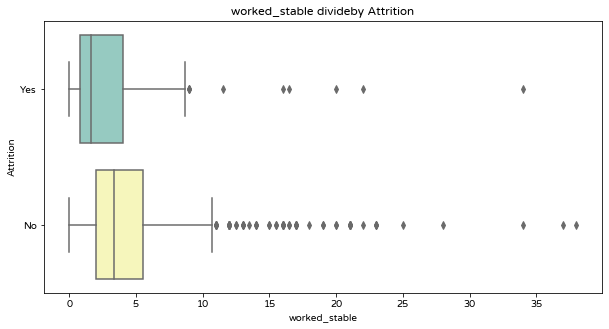

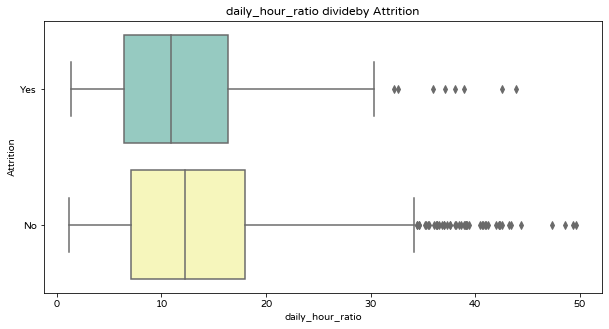

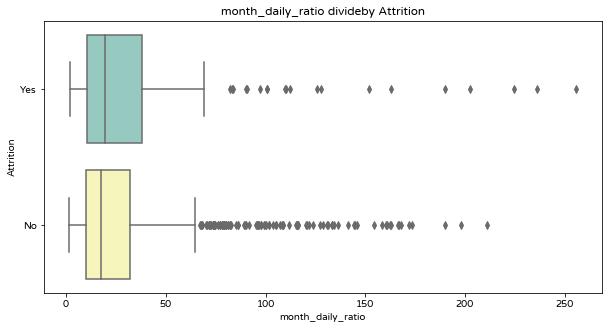

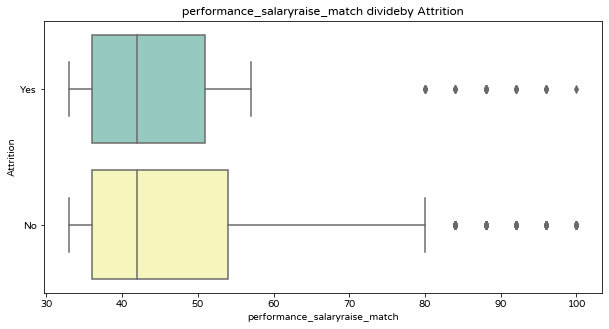

In [25]:
#numerical variable
for c in new_numeric_var:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=c,palette = "Set3", y='Attrition', data=data,orient='h').set(title=f'{c} divideby Attrition')
    plt.show()

In [26]:
#Look categorical divide by attrition use percentage to look clearly difference
for c in new_categorical_var:
    table=pd.crosstab(data.Attrition,data[c])

    print(f'{c} divideby Attrition')
    display(table/table.sum())

    print('*'*50,'\n\n')

manager_change divideby Attrition


manager_change,False,True
Attrition,,
No,0.848071,0.787611
Yes,0.151929,0.212389


************************************************** 


company_change divideby Attrition


company_change,False,True
Attrition,,
No,0.883249,0.831893
Yes,0.116751,0.168107


************************************************** 


role_change divideby Attrition


role_change,False,True
Attrition,,
No,0.851582,0.772152
Yes,0.148418,0.227848


************************************************** 




據上圖觀察，新增變數中，差異較大變數為，worked_stable、manager_change、role_change，刪除HourlyRate、MonthlyRate、DailyRate和其餘不明顯的新增變數

In [27]:
delete_var=[
      'DailyRate', 'HourlyRate', 'MonthlyRate',
      'daily_hour_ratio', 'month_daily_ratio',
      'performance_salaryraise_match', 'company_change',
]

data.drop(delete_var,axis=1,inplace=True)

new_categorical_var=[v for v in new_categorical_var if v not in delete_var]
new_numeric_var=[v for v in new_numeric_var if v not in delete_var]
categorical_var=[v for v in categorical_var if v not in delete_var]
categorical_order_var=[v for v in categorical_order_var if v not in delete_var]
numeric_var=[v for v in numeric_var if v not in delete_var]

In [28]:
Y=data['Attrition'] #預測目標
Y=[1 if s == 'Yes' else 0 for s in Y] #label encoder Y

data.drop(['Attrition'],axis=1,inplace=True) #捨棄label變數，變成訓練資料X

numeric_var+=new_numeric_var
categorical_var+=new_categorical_var
categorical_var.remove('Attrition')

# Step3: Modeling
* 將categorical的變數用Onehot encoding轉換(因為是無序)
* 有序類別變數資料已用label encoding 表示
* 多重線性資料，Regression不是好選擇，使用樹類方法建模
* 將訓練好的模型存成pickle檔做後續預測使用

In [29]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score,classification_report,roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV

import scipy

In [30]:
one_hot_list=[]
transform_data=[]

for v in categorical_var:
    enc = OneHotEncoder(handle_unknown='ignore')

    x=enc.fit_transform(data.loc[:,v].values.reshape(-1,1))

    if scipy.sparse.issparse(x):
        x=x.todense()

    transform_data.append(pd.DataFrame(x,columns=[f'{v}-{s}' for s in enc.categories_[0]]).reset_index(drop=True))
    one_hot_list.append(enc)

#保存美個類別變數的onehotencoder，預測資料或新資料轉置時會需要
one_hot_encoder={f'{name}_onehot':enc for name,enc in zip(categorical_var,one_hot_list)}

data=data.drop(categorical_var,axis=1)
#原始data與onehot轉置後的data合併
onehot_data=pd.concat(transform_data,axis=1)

#轉成整數型態
for v in onehot_data.columns:
    onehot_data[v]=onehot_data[v].astype('int')

data=pd.concat([data,onehot_data],axis=1)

In [31]:
x_train,x_test,y_train,y_test=train_test_split(data,Y,test_size=0.3,random_state=0)

### RandomForest Classifier

In [32]:
# Parameter tuning
grid = {'n_estimators': [100,300,500],
        'max_features': [None,10,'sqrt'],
        'max_depth': [None,5,10],
        'min_samples_split':[2,5],
        'bootstrap': [True, False]}

rf=RandomForestClassifier(random_state=0)
rf_cv=RandomizedSearchCV(estimator=rf, param_distributions=grid, scoring='roc_auc',
                         n_iter=108, cv=5, random_state=0, n_jobs=-1)
rf_cv.fit(x_train, y_train)
print("Grid Search CV Best AUC = {:.3f}\nBest Params: {}".format(rf_cv.best_score_, rf_cv.best_estimator_))

Grid Search CV Best AUC = 0.824
Best Params: RandomForestClassifier(max_features='sqrt', min_samples_split=5,
                       n_estimators=300, random_state=0)


In [33]:
model = RandomForestClassifier(n_estimators=300,random_state=0,min_samples_split=5,max_features='sqrt',).fit(x_train,y_train)

In [34]:
prediction=model.predict(x_test)

In [35]:
print(classification_report(y_true=y_test,y_pred=prediction))

              precision    recall  f1-score   support

           0       0.87      0.99      0.93       371
           1       0.85      0.24      0.38        70

    accuracy                           0.87       441
   macro avg       0.86      0.62      0.65       441
weighted avg       0.87      0.87      0.84       441



In [36]:
result=pd.DataFrame({'Real':y_test,'Predict':prediction})

pd.crosstab(result['Real'],result['Predict'])

Predict,0,1
Real,,
0,368,3
1,53,17


In [37]:
roc_auc_score(y_true=y_test,y_score=prediction)

0.6173854447439353

<AxesSubplot:xlabel='var_name', ylabel='importance'>

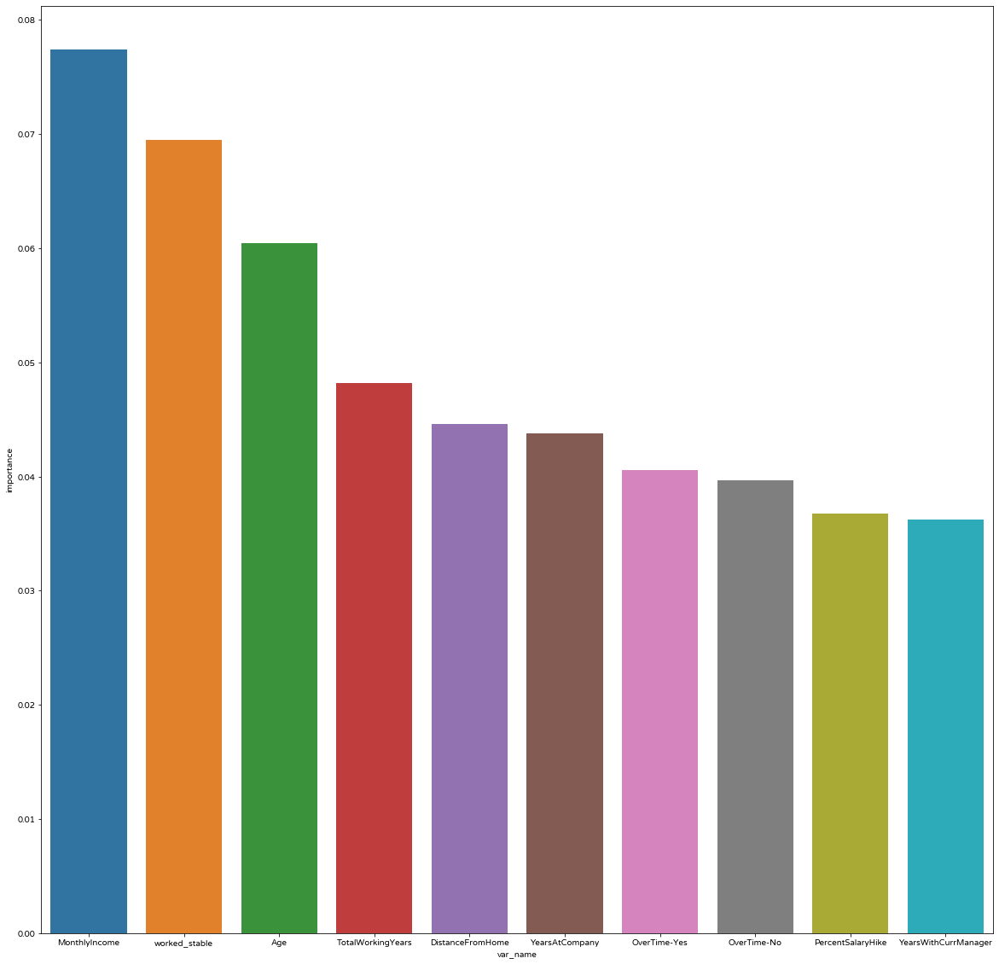

In [38]:
var_imp=pd.DataFrame({'var_name':x_train.columns,'importance':model.feature_importances_}).sort_values(['importance'],ascending=False).iloc[:10]

plt.figure(figsize=(20,20))

sns.barplot(x=var_imp['var_name'],y=var_imp['importance'])

### save model with pickle format

In [39]:
import pickle

tmp={'one_hot_encoder':one_hot_encoder,'model':model,'categorical_var':categorical_var,'numeric_var':numeric_var}

with open(f'{path}model.pickle','wb') as f:
    pickle.dump(tmp,f)

# Step4: 預測函數

* load pickle file
* predict

In [40]:
import pickle

#load model
with open(f'{path}model.pickle','rb') as f:
    b=pickle.load(f)

globals().update(b)

In [41]:
def predict(dat,model):
    if not isinstance(dat,pd.DataFrame):
        raise RuntimeError('Data must be given by dataframe type')

    if 'Attrition' in dat:
        return dat['Attrition']

    dat.drop(['StandardHours','EmployeeCount','EmployeeNumber','Over18'],axis=1,inplace=True)
    #新增變數
    dat['worked_stable']=dat['TotalWorkingYears']/(dat['NumCompaniesWorked']+1)
    dat['manager_change']=dat['YearsAtCompany'] == dat['YearsWithCurrManager']
    dat['role_change']=dat['YearsAtCompany'] == dat['YearsInCurrentRole']

    #刪除變數
    dat.drop(['DailyRate', 'HourlyRate', 'MonthlyRate'],axis=1,inplace=True)

    #類別變數轉換
    transform_data=[]

    for v in categorical_var:
        enc = one_hot_encoder[f'{v}_onehot']

    x=enc.transform(dat.loc[:,v].values.reshape(-1,1))

    if scipy.sparse.issparse(x):
        x=x.todense()

    transform_data.append(pd.DataFrame(x,columns=[f'{v}-{s}' for s in enc.categories_[0]]).reset_index(drop=True))

    dat=dat.drop(categorical_var,axis=1)
    #原始data與onehot轉置後的data合併
    onehot_data=pd.concat(transform_data,axis=1)

    #轉成整數型態
    for v in onehot_data.columns:
        onehot_data[v]=onehot_data[v].astype('int')

    dat=pd.concat([dat,onehot_data],axis=1)

    prediction=model.predict(dat)

    return ['Yes' if r == 1 else 'No' for r in prediction]

# Step5: 結論

1. 當有員工問卷的任一項(工作滿意度、環境滿意度、同儕滿意度、工作參與程度等等)極度不滿意時，需要立即關注並引導，找出員工發生不滿的原因、問題，偕同改善，該員工有較高機會離職

2. 底層、年輕的員工需要較多時間了解他們想法，適時給予協助與鼓勵，本身可能因工作的挑戰度、薪水不高，有較多的變動因子
3. 當有超時工作發生時，要觀察現象是偶發還是常常，此為員工離職原因的重要因素，可以適時找員工一對一談談，看是否需要協助
4. 當願意聘用在過往頻繁換工作(在同一家公司待的任期很短)的員工，本身穩定性不足，有較大的風險，聘用時宜謹慎對待
5. 當模型精準度提高時，建議採用該模型預測的機率，找出中高風險族群，密切注意員工狀態，可以一對一會談，或適當的閒聊。滿意度調查基本上當參考，員工注重實質的如職位高低、月收入等實質價值，如果有高風險但非他不可的人才，就不要吝嗇給予權利與財富。

## 未來方向

1. 目前未處理data是微imbalanced的狀態，用準確度判別並不精準，使用較好的指標F1 score可，以發現目前模型表現並不好，可以嘗試用SMOTE增量sample的方式，讓資料集標籤達到相近的數量。
2. 變數篩選，刪除高度相近的特徵
3. 嘗試其他演算法如logistic、SVM方法
4. 嘗試增加資料或新增變數提升數據訊息
5. 將連續變數標準化，再進行看模型表現
